In [1]:
import math, copy
import random as rnd
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d
from random import seed
from random import random
from sklearn.utils import shuffle


In [2]:
df=pd.read_csv("student_scores.csv", names=['x', 'y'])
df = shuffle(df)
x_train = df.x.values
y_train = df.y.values

In [3]:
df.head(10)

,x,y
14,1.1,17
16,2.5,30
12,4.5,41
5,1.5,20
6,9.2,88
9,2.7,25
4,3.5,30
15,8.9,95
3,8.5,75
10,7.7,85


In [4]:
print(f"Размер датасета: {df.shape}")

Размер датасета: (25, 2)


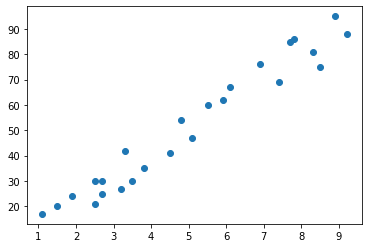

In [5]:
plt.scatter(x_train, y_train)

In [6]:
seed(1)
theta0 = random()
theta1 = random()
alpha = 0.001  
mses = []


for i in range(10):     

    for i in range(len(df)):
        x = x_train[i]
        y = y_train[i]

        
        h = theta1 * x + theta0
        mse = (h - y)**2
        print(mse)
        mses.append(mse)
        
        dtheta0 = 2 * (h - y)
        dtheta1 = 2 * x * (h - y)
        t0 = theta0 - alpha * dtheta0
        t1 = theta1 - alpha * dtheta1
    
        theta0 = t0
        theta1 = t1


253.87510440010365
763.2815451771224
1309.4049420387048
312.8192765158501
5594.544708232706
289.9191886878367
378.3280364681307
4585.341187782439
1485.0157217439041
2188.5290381993022
311.90113836642325
32.43301024467203
945.9850220250034
427.58253220632736
516.6059674649972
111.3699270174442
647.7686104313673
923.3437021136427
29.89159514228167
3.237354100496688
527.2273191351002
246.19698638963902
182.4955156804444
53.27612977649624
40.35648148833131
42.69006554892481
61.76618415619971
4.1202067227834105
36.86197549365519
88.30155792412974
0.22402794466704845
1.932735687150187
303.5681943582396
3.3262957531736363
240.70248665952852
0.5677758594060143
9.797756646860446
106.47491328064449
104.76542641433895
65.93482206621665
22.80078031955975
3.718956959257799
128.75392280303515
8.086815935861145
25.37120029001175
79.72271755714789
30.605878741186263
10.976860452759823
20.321024597357752
5.649945812679474
23.11035513771388
17.93707130259998
17.86678186038737
15.521109341359043
6.639762

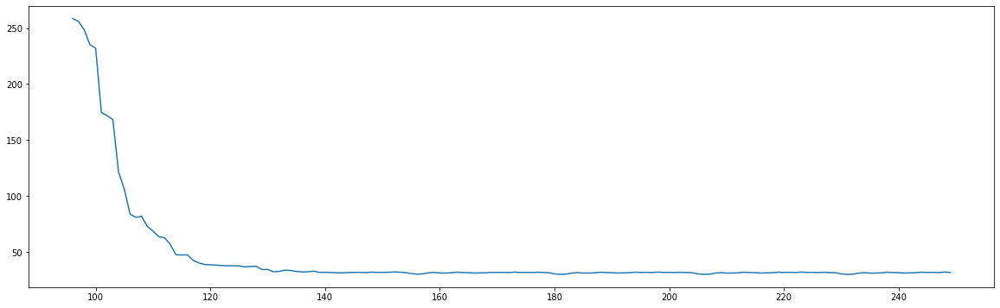

(theta1,theta0) found: (  9.9656,  1.6632)


In [7]:
yplot = np.array(mses)
xplot = np.array(range(0, len(mses)))
plt.figure(figsize=(20,6)) 
plt.plot(pd.DataFrame (mses).rolling(97).mean()) 
plt.show()

print(f"(theta1,theta0) found: ({theta1:8.4f},{theta0:8.4f})")   # 8 знаков до запятой, 4 после. Форматирование строки

In [8]:
np.shape(theta1)

()

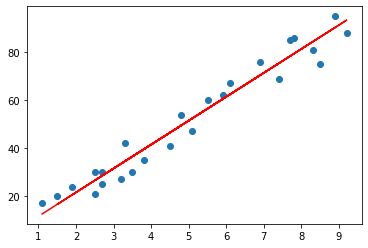

In [9]:
df['y_preg']=theta0+theta1*df.x
plt.scatter(df.x, df.y)
plt.plot(df.x, df.y_preg, c='r')

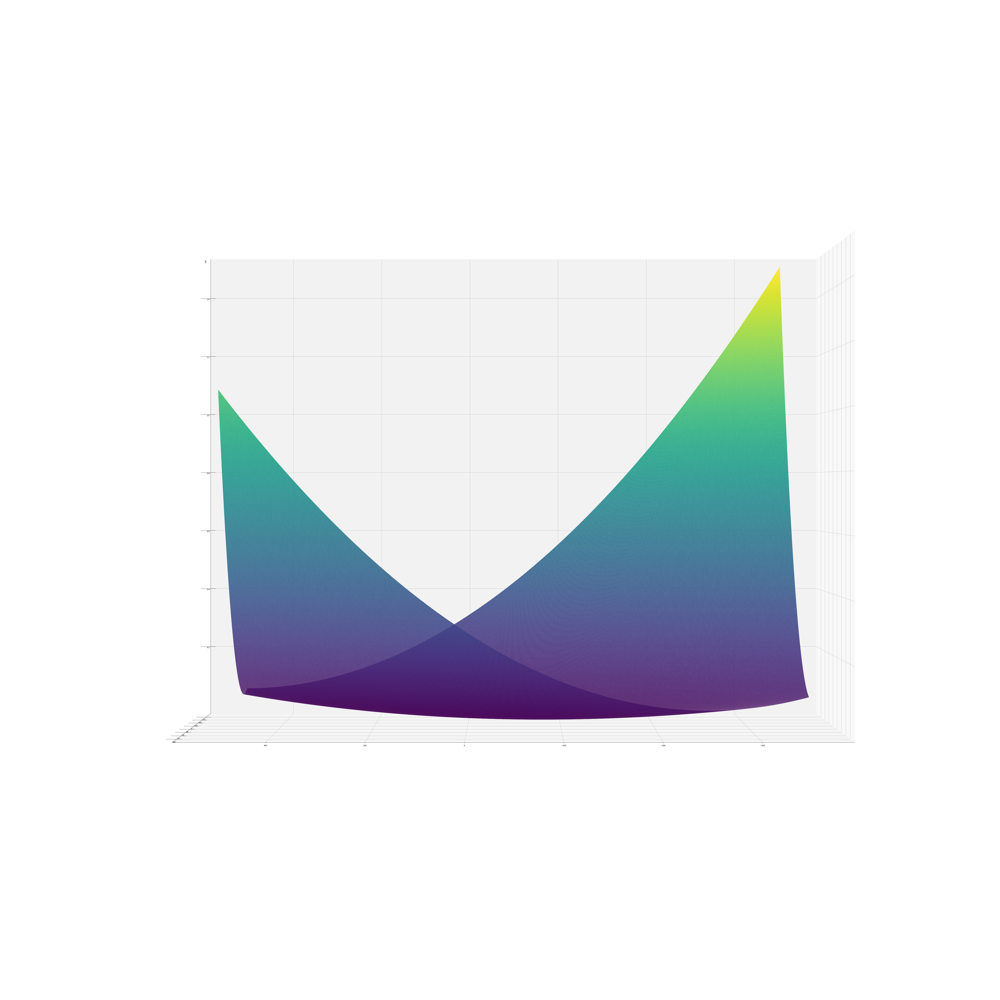

In [10]:
errors = []
err = 0
t0_arr = []
t1_arr = []

x = df['x'].values
y = df['y'].values

for i in np.arange(t0 - 700, t0 + 500, 1):
    for j in np.arange(t1 - 100, t1 + 100, 1):
        err = 0
        for k in range(len(df)):
            x_i = x[k]
            y_i = y[k]
            h = j * x_i + i
            err += (h - y_i) ** 2
        err = err / len(df)
        errors.append(err)
        t0_arr.append(i)
        t1_arr.append(j)
        
fig = plt.figure(figsize=(100, 100))
ax = fig.add_subplot(111, projection='3d')
ax.plot_trisurf(np.array(t0_arr), np.array(t1_arr), np.array(errors), cmap='viridis')
ax.view_init(0, 90)

In [11]:
errors = []
err = 0
step = 0.1
scope = 10
t0_arr = np.arange(t0 - scope, t0 + scope, step)
t1_arr = np.arange(t1 - 4, t1 + 4, step)


for i in t0_arr:
    for j in t1_arr:
        err = 0
        for k in range(len(df)):
            x_i = x[k]
            y_i = y[k]
            h = j * x_i + i
            err += (h - y_i) ** 2
        err/=len(df)
        errors.append(err)

1.6632286345289593 9.965554606567684


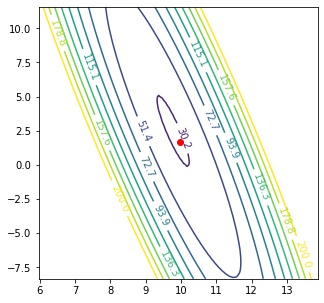

In [12]:
plt.figure(figsize=(5,5))
curves = plt.contour(t1_arr, t0_arr, np.array(errors).reshape(len(t0_arr), len(t1_arr)), np.linspace(9, 200, 10))
plt.clabel(curves)
plt.plot(t1, t0, 'ro')
print(t0, t1)
plt.show()